In [137]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [138]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [139]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [140]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [141]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [142]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)    
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6

    prom = Phi.size()[0]
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [143]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([253.2221], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([200.2912], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([172.4101], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([154.5948], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([141.7406], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([131.6967], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([123.3946], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([116.2382], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([109.8652], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([104.0401], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([98.6009], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([93.4309], grad_fn=<DivBackward0>)
Epoch 13
 -----------------

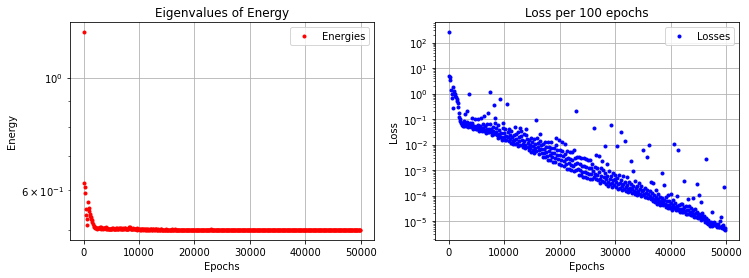

In [144]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

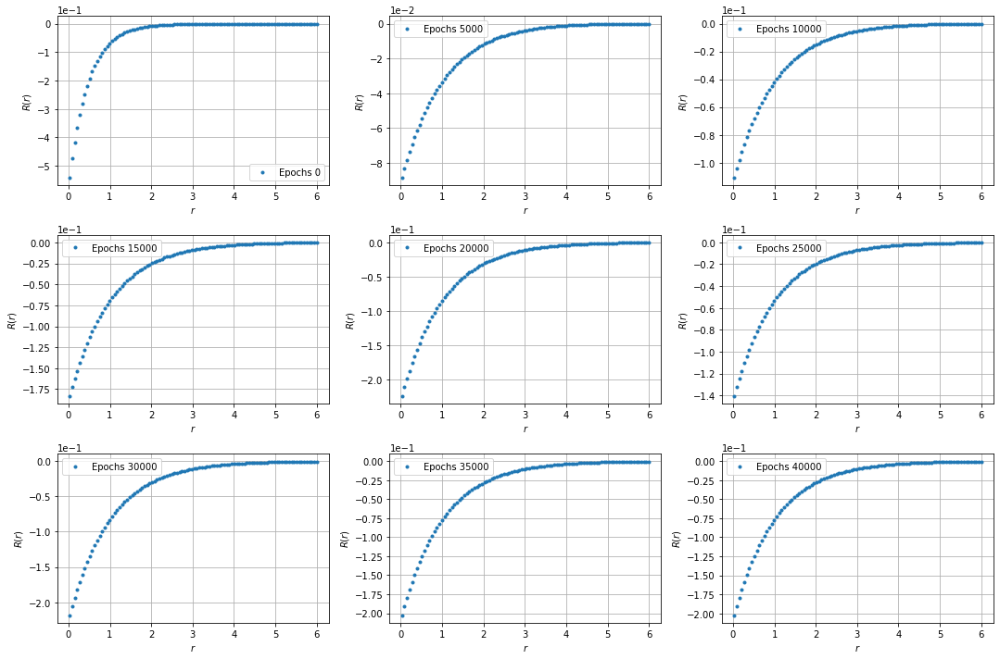

In [145]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [146]:
Es

array([ 0.22867462, -0.3823411 , -0.39245406, -0.4098242 , -0.44942504,
       -0.4645325 , -0.47425213, -0.4879052 , -0.43171784, -0.4475193 ,
       -0.4554489 , -0.46134308, -0.46608216, -0.47017342, -0.47393772,
       -0.47761396, -0.48143095, -0.48562747, -0.49002138, -0.49269387,
       -0.49402267, -0.49502563, -0.49581742, -0.49645278, -0.49607494,
       -0.49671167, -0.49651036, -0.4956625 , -0.49662176, -0.49411786,
       -0.49592596, -0.49670175, -0.492704  , -0.49535352, -0.49636555,
       -0.49708545, -0.49659204, -0.49452847, -0.49564552, -0.4966681 ,
       -0.49735567, -0.49375704, -0.49561188, -0.49670005, -0.49742675,
       -0.49691954, -0.49756187, -0.49721295, -0.49680746, -0.49749732,
       -0.49679062, -0.49758378, -0.49476507, -0.49635506, -0.49731258,
       -0.4979273 , -0.49671543, -0.49757943, -0.49642667, -0.4972664 ,
       -0.49793488, -0.49608365, -0.4972438 , -0.49794433, -0.49451664,
       -0.49663338, -0.49760264, -0.4981838 , -0.49618718, -0.49

In [147]:
np.mean(Es)

-0.49613538

In [189]:
norm = torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)
norm = norm.detach()
norm

tensor([0.0065])

In [190]:
torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)/norm

tensor([1.], grad_fn=<DivBackward0>)

In [191]:
Phi_0 = Phi_t(R_train)
#Phi_0 = Phi_0/torch.sqrt(norm)
Phi_0 = Phi_0.detach()
new = torch.trapezoid(Phi_0[100:]**2,R_train[100:],dim=0)
new

tensor([0.0065], grad_fn=<DivBackward1>)

In [192]:
Phi_0

tensor([[ 4.3649e+02],
        [ 4.0556e+02],
        [ 3.7680e+02],
        [ 3.5005e+02],
        [ 3.2518e+02],
        [ 3.0206e+02],
        [ 2.8056e+02],
        [ 2.6058e+02],
        [ 2.4200e+02],
        [ 2.2472e+02],
        [ 2.0867e+02],
        [ 1.9374e+02],
        [ 1.7987e+02],
        [ 1.6698e+02],
        [ 1.5499e+02],
        [ 1.4386e+02],
        [ 1.3351e+02],
        [ 1.2389e+02],
        [ 1.1496e+02],
        [ 1.0666e+02],
        [ 9.8943e+01],
        [ 9.1778e+01],
        [ 8.5121e+01],
        [ 7.8938e+01],
        [ 7.3195e+01],
        [ 6.7861e+01],
        [ 6.2907e+01],
        [ 5.8307e+01],
        [ 5.4036e+01],
        [ 5.0070e+01],
        [ 4.6388e+01],
        [ 4.2970e+01],
        [ 3.9797e+01],
        [ 3.6852e+01],
        [ 3.4119e+01],
        [ 3.1583e+01],
        [ 2.9230e+01],
        [ 2.7046e+01],
        [ 2.5021e+01],
        [ 2.3142e+01],
        [ 2.1399e+01],
        [ 1.9783e+01],
        [ 1.8285e+01],
        [ 1

In [220]:
model_1 = NeuralNetwork()
model_1

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [221]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [222]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0
global Phi_0

V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)

In [223]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data, gain=0.50)

In [224]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=-6 to 6
    
    global E_1
    E_1 = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E_1*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [225]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 5e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=1)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer_1)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E_1.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([47136.4453], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([78826.7969], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([46448.2617], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([36814.9023], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([31316.1934], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([26697.1055], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([22679.4121], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([19449.6016], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([17059.1582], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([15353.2070], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([14096.3154], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([13089.4697], grad_fn=<DivBackward0>)
E

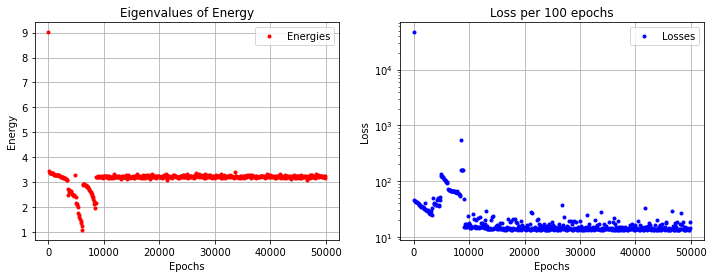

In [226]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

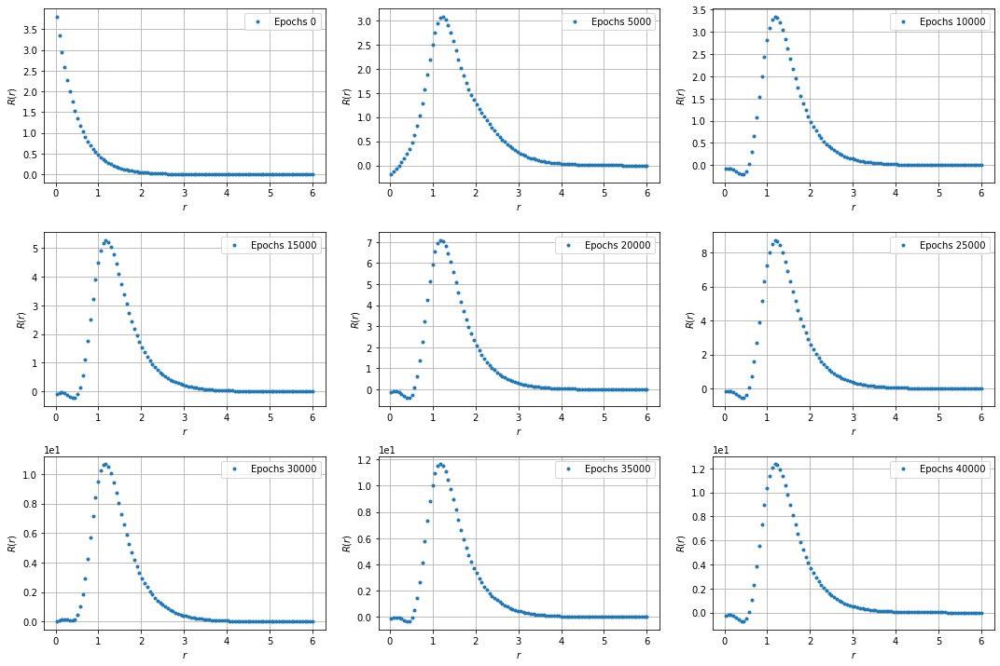

In [227]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [228]:
Es_1

array([9.016517 , 3.4385836, 3.3720555, 3.3713923, 3.3712833, 3.3698752,
       3.366988 , 3.362605 , 3.3556645, 3.3400488, 3.3024206, 3.2854125,
       3.2847586, 3.286857 , 3.2898095, 3.2850387, 3.2789721, 3.2742233,
       3.265986 , 3.254931 , 3.27256  , 3.2309744, 3.2212508, 3.213777 ,
       3.219112 , 3.2157242, 3.1660397, 3.1956909, 3.1604497, 3.1465023,
       3.150352 , 3.1277435, 3.1058817, 3.0954146, 3.0899932, 2.4885762,
       2.731959 , 2.6992788, 2.609842 , 2.6491258, 2.6085436, 2.624997 ,
       2.5369678, 2.5315304, 2.495952 , 2.4958339, 2.4284377, 2.4798872,
       3.2944663, 2.385142 , 2.1449704, 2.1056147, 2.065612 , 2.018613 ,
       1.7584977, 1.6843591, 1.609332 , 1.5323459, 1.4477732, 1.349913 ,
       1.231373 , 1.0802003, 2.879108 , 2.9351482, 2.9227228, 2.9099655,
       2.8958888, 2.8800833, 2.8619778, 2.8408327, 2.8154972, 2.7845426,
       2.7479932, 2.7106645, 2.6751297, 2.637451 , 2.5951085, 2.543385 ,
       2.5220904, 2.448455 , 2.3862946, 2.3236601, 